# Introduction

##🐶  End-to-End Multi-class Dog Breed classification

This notebook builds an end to end multiclass image classifier using TensorFlow 2.0 and TensorFlow Hub

1. Problem

> Idenitfying the bread of a dog given am image pf a dog

2. Data



The data we are using is from Kaggle's dog breed identification competeteion: https://www.kaggle.com/competitions/dog-breed-identification/data



3. Evaluation

> The evaluation is a file with prediction probabiltiies of each dog bread of ech test image.

4. Features

> Some information about the data:
* images (unstructured data) - best to use deep learning/transfer learning
* 120 breeds of dogs - meas there are 120 different classes
* there are around 10,000+ images in train set(these images have labels)
* there are around 10,000+ images in test set(these images have no labels)


**Framework:**
> Below are the steps followed in the project
1. Get data ready (aka turn into Tensors)
2. Pick a model (to suit yoru problem)
3. Fit the model to the data and make prediction
4. Evaluate the model
5. Improve through experimentation
6. Save and reload your trained model


#Get workspace ready

* Mount Google Drive
* Unzip downloaded dataset
* Import TensorFlow 2.x, Import TensorFlow Hub and Make sure we're using a GPU

### Mounting google drive

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Unzip the dataset content in google drive
First time user should uncomment below code

In [8]:
#Unzip the uploaded data into Google Drive
# !unzip "/content/drive/MyDrive/DogVision/dog-breed-identification.zip" -d "drive/MyDrive/DogVision/"

### Import TensorFlow 2.x, Import TensorFlow Hub and other required libraries and Make sure we're using a GPU

*TensorFlow is a Python-friendly open source library for numerical computation that makes machine learning and developing neural networks faster. TensorFlow Hub is a repository of trained machine learning models ready for fine-tuning and deployment*


In [9]:
#Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import os
# View an image
from IPython.display import Image
print ("TF version:", tf.__version__)
print ("TF Hub version:", hub.__version__)

#Check for GPU availability
print("GPU", "availability (YES!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.13.0
TF Hub version: 0.14.0
GPU not available :(


# Data Exploration

Reading labels for training dataset and checking the content of the file


In [10]:
labels_csv = pd.read_csv("/content/drive/MyDrive/DogVision/labels.csv")


In [11]:
# Checking data description
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [12]:
# checking the head
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


## Visualize training dataset
Using below graph we want ensure we have enought data for each class since having data skewed for one class can add bias to the modal.

<Axes: >

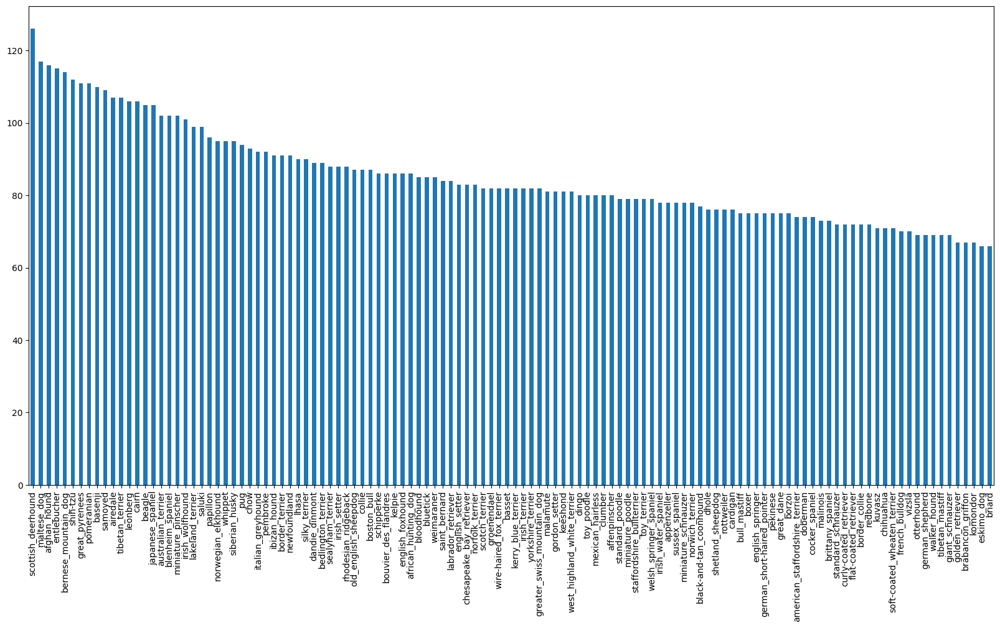

In [13]:
#Visualizing dataset by each class
labels_csv["breed"].value_counts().plot.bar(figsize = (20, 10))

In [14]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

In [15]:
labels_csv["breed"].value_counts().median()

82.0

*Note: Minimum number of annotations per label is 10 for model trainig purpose for object detection (https://cloud.google.com/vision/automl/object-detection/docs/prepare)* from above median its clear that we have enough data for each class.

## Exploring images and gathering file path

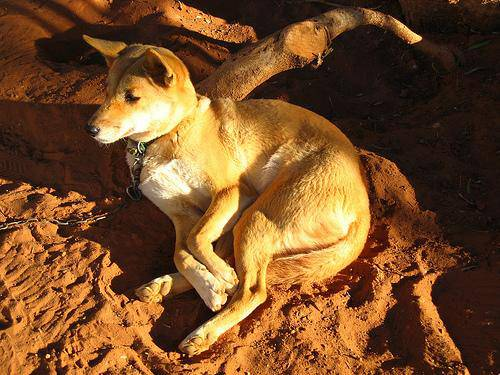

In [16]:
Image("/content/drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [17]:
#Create pathnames from image ID's
filenames = [fnames for fnames in labels_csv["id"]]

In [18]:
#Check the first 10
filenames[:10]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64']

In [19]:
# create full path
filenames = ["/content/drive/MyDrive/DogVision/train/" + fnames + ".jpg" for fnames in labels_csv["id"]]

In [20]:
filenames[:10]

['/content/drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [21]:
#Check whether number of filenames matches number of actual image files
if len(os.listdir("/content/drive/MyDrive/DogVision/train/")) == len(filenames):
  print("Filenames MATCH")
else:
     print("Doesn't macth")

Filenames MATCH


In [22]:
filenames[9000]

'/content/drive/MyDrive/DogVision/train/e20e32bf114141e20a1af854ca4d0ecc.jpg'

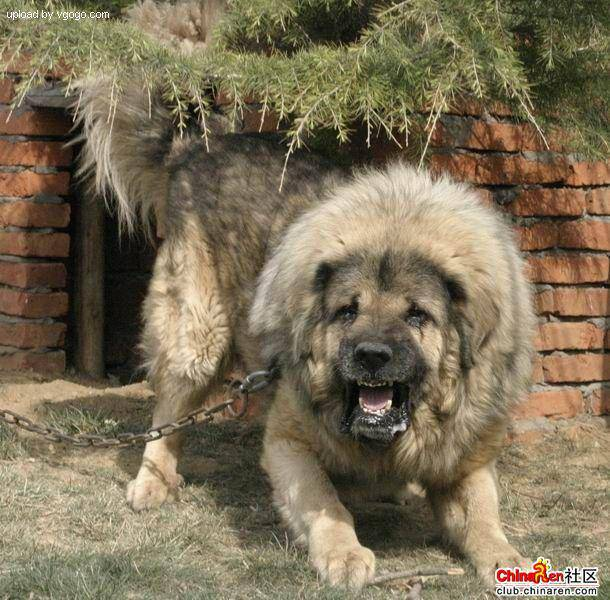

In [23]:
# Another check
Image(filenames[9000])


In [24]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [25]:
import numpy as np
#since we have our training image filepaths in a list, let us a prepare our tables
# Turn into array
labels = labels_csv["breed"]
labels = np.array(labels) #OR labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [26]:
len(labels)

10222

In [27]:
# Check if the labels match the number of filenames
if len(labels) == len(filenames):
  print("MATCHED!")

MATCHED!


In [28]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

## Getting labels ready for each class(dog breeds)

In [29]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [30]:
#turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

*This is done to be able to convert them into numbers further / OneHotEncoded numbers*

In [31]:
len(boolean_labels)

10222

In [32]:
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [33]:
# Try for another
print(labels[2])
print(boolean_labels[0].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating small model on a subset of 1000 rows for first model

Starting small with a dataset of 1000 from original to see how much time modal training takes

In [34]:
#Set up X and y variables
X = filenames
y = boolean_labels

In [35]:
len(filenames)

10222

Must start experiemnting with ~1000 images and increase as needed

In [36]:
#Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", main:1000, max:10000, step:100}

In [37]:
# Split the data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)



In [38]:

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [39]:
# Looking at the training data
X_train[:5], y_train[:5]

(['/content/drive/MyDrive/DogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/DogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/DogVision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/DogVision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/DogVision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, Fa

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors(numerical matrix) we write function whihc:
1. take an image fielpath as input
2. use TensorFlow to read the file and save it to a variable `image`
3. turn `imahe` (a jpg) into Tensors
4. resize the `image` to be shape of (224, 224)
5. return the modified `image`

https://www.tensorflow.org/guide/data

https://www.tensorflow.org/tutorials/load_data/images

In [40]:
#Convert image to NumPy array
from matplotlib.pyplot import imread


In [41]:
#Using imread to load an image
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [42]:
image.max() #checking color channel limit

255

In [43]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [44]:
# Convert image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

## Bulk image conversion using custom function
Now we have seen what an image looks like as a Tensor, make a function to preprocess them.

1. take an image filepath as input
2. use TensorFlow to read the file and save it to a variable `image`
3. turn `image` (a jpg) into Tensors
4. resize the `image` to be shape of (224, 224)
5. return the modified `image`

In [45]:
#Define image size
IMG_SIZE = 224

# Create the function
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turns the image into Tensor.
  '''

  #Read in an image file
  image = tf.io.read_file(image_path)

  #Turn the jpeg image into numerical Tensor with 3 colour channls(RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # [The `tf.image` module contains various functions for image processing and decoding-encoding Ops]

  #Convert the colour channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image




# Creating TensorFlow BatchSet

In oder to efficiently uttilize GPU we will next batch the image in sets of 32 to avoid processing error.

*To use Tensorflow effectively, we need the data in the form of Tensor tuples which look like : `(image, label)`*

In [46]:
# create a simple function return a tuple (image, label)
def get_image_label(image_path, label):

  '''
  Takes an image file path name and the associated label, processes the image and returns a tuple of (image, label)
  '''

  image = process_image(image_path)
  return image, label

In [47]:
#Demo the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

* Now we have our image and label in the form of tuples of tensors int he form `(image, label)`
* Preprocessed the data to fit into the ML models
* Next will be `batches`, let us write another function `(X and y)`

In [48]:
#Define the batch size, 32 is a good start
BATCH_SIZE = 32

In [49]:
#Creating function
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (X) and labels (y) pirs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''

  #If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths (no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch


 # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data set batches")
    #Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    #Shuffling  pathnames and label before mapping processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    #Create (image, label) tuples (this also turns the path into a preprocessed image)
    data = data.map(get_image_label)

    #Turn the training dat aino batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch



In [50]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data set batches
Creating validation data batches...


In [51]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [52]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Visualize Data Batches

Data is now in batches but hard to understand , hence the visualization

In [53]:
import matplotlib.pyplot as plt

In [54]:
#Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''

  #Setup the figure
  plt.figure(figsize=(10, 10))
  #Loop through 25
  for i in range(25):
   #create subplots (5 r, 5 c)
    ax = plt.subplot(5, 5, i+1)
   #Display an image
    plt.imshow(images[i])
   #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
   #Turn the grid lines off
    plt.axis("off")



In [55]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [56]:
myIterator=train_data.as_numpy_iterator()

In [57]:
train_images, train_labels = next(myIterator)
train_images, train_labels

(array([[[[1.32194057e-01, 1.51801899e-01, 1.28272489e-01],
          [1.36804491e-01, 1.56412333e-01, 1.32882923e-01],
          [1.45413175e-01, 1.65021017e-01, 1.41491607e-01],
          ...,
          [5.08257151e-01, 5.63159108e-01, 6.05666161e-01],
          [4.62149858e-01, 5.17051816e-01, 5.60189068e-01],
          [4.53396350e-01, 5.08298278e-01, 5.51435530e-01]],
 
         [[1.33333340e-01, 1.52941182e-01, 1.29411772e-01],
          [1.39682829e-01, 1.59290671e-01, 1.35761261e-01],
          [1.48045555e-01, 1.67653397e-01, 1.44123986e-01],
          ...,
          [4.89770591e-01, 5.44672549e-01, 5.87179601e-01],
          [4.65012252e-01, 5.19914210e-01, 5.63051462e-01],
          [4.56258744e-01, 5.11160672e-01, 5.54297924e-01]],
 
         [[1.36075303e-01, 1.55683145e-01, 1.32153735e-01],
          [1.41430318e-01, 1.61038160e-01, 1.37508750e-01],
          [1.50115609e-01, 1.69723451e-01, 1.46194041e-01],
          ...,
          [4.70040083e-01, 5.24942040e-01, 5.6744

In [58]:
len(train_images), len(train_labels)

(32, 32)

In [59]:
unique_breeds[y[0].argmax()]

'boston_bull'

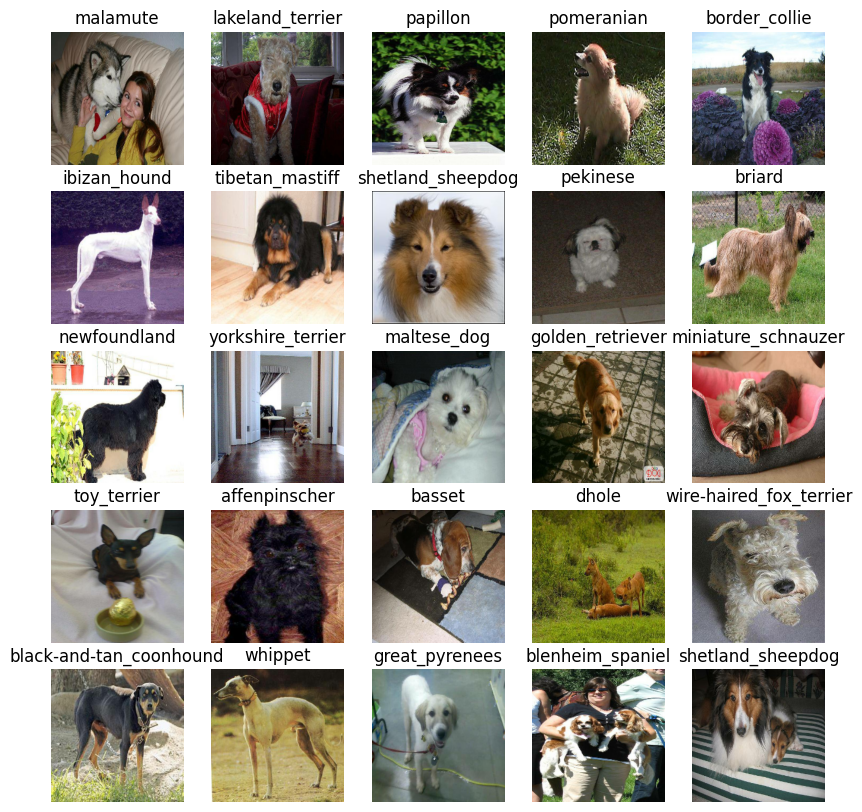

In [60]:
# Visualizing the data in a training batch now
show_25_images(train_images, train_labels)


# Pick a model to suit our problem
Before we build a model, there is transfer learning to explore!
Let us define:
* the input shape (our images shape, in the form of Tensors) to our model
* the uouput shape (images, labels, in th eform of Tensors) of our model
* the URL of the model we want to use: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5



In [61]:
#Set up input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

#Set up output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#Set up model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5" #TensorFlow is one of the biggest frameworks for deep learning (+ Pytorch, Papers with Code, Model Zoo)

#fun fat : TESLA uses Resnet_50 backbones often (https://www.youtube.com/watch?v=oBklltKXtDE&t=173s)

# tf.keras - high level tensor APIs : https://www.tensorflow.org/guide/keras

## Create model object using keras and defining layers
Now we have the inputs , outputs and model ready to go
let us put them together into a Keras deep learning model.


Let us create a function which:
* takes the input hsape output shape,model we chose as parameters
* define the layers in a Keras model in sequential fashion
* compliles the model (says it should be evaluated and improved)
* builds the model (tells the model the input shape it will ne getting)
* return the model

***
The tf.keras.Model class features built-in training and evaluation methods:

- tf.keras.Model.fit: Trains the model for a fixed number of epochs.
- tf.keras.Model.predict: Generates output predictions for the input samples.
- tf.keras.Model.evaluate: Returns the loss and metrics values for the model; configured via the tf.keras.Model.compile method.

https://www.tensorflow.org/guide/keras

**Convolutional Neural Networks and stacking (data structures)**

https://towardsdatascience.com/review-mobilenetv2-light-weight-model-image-classification-8febb490e61c

https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53

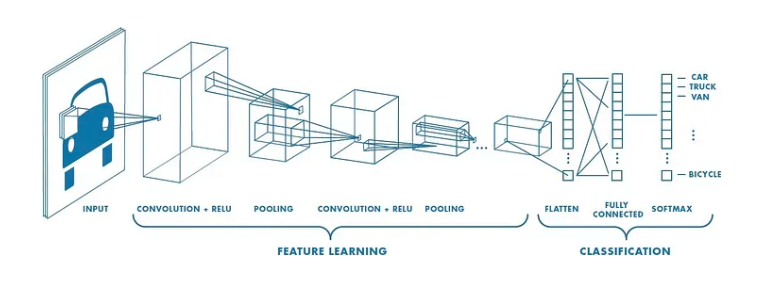

Selecting activation Function and loss
- Binary classification -
Activation:Sigmoid | Loss:Crossentrophy
- Multi-class classification -
Activation:Softmax | Loss Categorical Crossentrophy


https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/

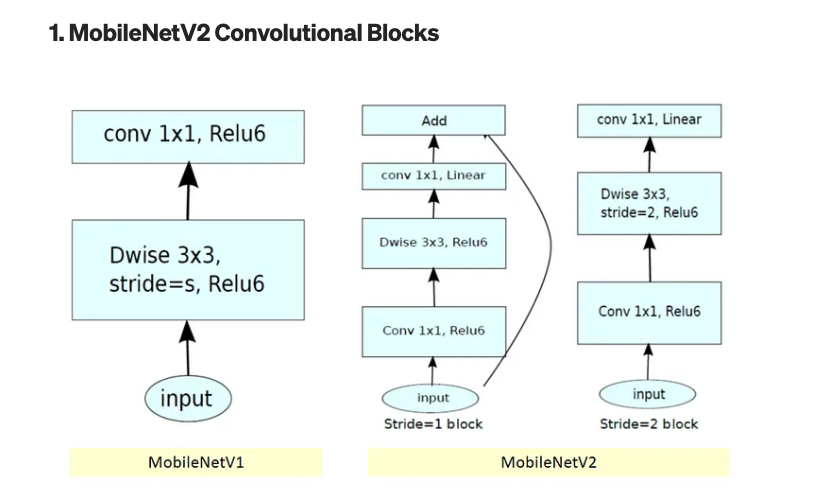

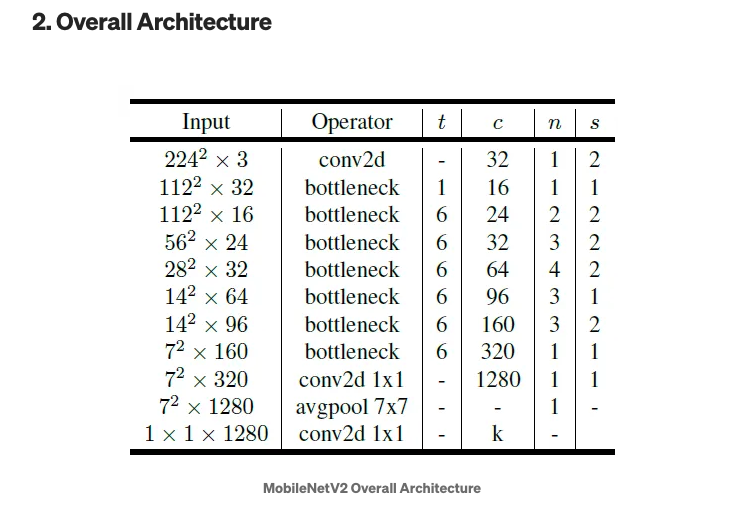

In [62]:
#Create a function which builds a Keras model
def create_model (input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url= MODEL_URL):
  print("Building model with:", MODEL_URL)

  #Set up the model layers. #instantiating the model in this step
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") #Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [63]:
model = create_model()
model

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5


In [64]:
# Check modal summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1664)              3766048   
                                                                 
 dense (Dense)               (None, 120)               199800    
                                                                 
Total params: 3965848 (15.13 MB)
Trainable params: 199800 (780.47 KB)
Non-trainable params: 3766048 (14.37 MB)
_________________________________________________________________


## Creating Callbacks
 A python class meant to be subclassed to provide specific functionality, with a set of methods called at various stages of training, testing, predicting. Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving

**We create two callbacks, one for `TensorBoard` which helps track our models progress and another for early stopping which prevents our model from training for to long.**


### TensorBoard Callback

To set up a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our models traning logs with the `%tensorboard` magic function (to be done ater model training)


In [65]:
#Load TensorBoard notebook extension
%load_ext tensorboard

In [66]:
import datetime
#create a function to build a TB callback
def create_tensorboard_callback():
  #Create a log directory for storing Tensorboard logs
  logdir = os.path.join("drive/MyDrive/DogVision/logs", #Make it so the logs get tracked whenever we run experiement
                 datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

 ### Early Stopping Callback (prevents over fitting)
 https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

 Early stopping helps stop the model fro overfitting by stopping training if a certai evaluation metric stops improving.

In [67]:
#Create early stopping calback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Training the (deep learning) model (on a subset of data)

Our first model is ony going to train on 1000 images, to ensure everything is working.

**NUM_EPOCHS** defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

In [68]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, steps:10}

In [69]:
# Check to make sure we are still running on a GPU
print("GPU available (YES!)" if tf.config.list_physical_devices("GPU") else "not available!")

not available!


Let us create a function which trains a model.
* create a model using `create_model()`
* set up a TensorBoard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the trainign data, validation data, number of epochs to train for (NUM_EPOCHS) and the calbacks we'd like to use
* return the model

In [70]:
#Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version
  '''

  #Create a model
  model = create_model()

  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passingit the callbacks we created
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks = [tensorboard, early_stopping])

  #Return yhe fitted model
  return model

In [71]:
#Fit the model to the data
#model = train_model() #this has been commented out after saving the first model on google drive

**So what are the ways to prevent over fitting in deep learning neural network models? Explore! **

###Checking the TensorBoard logs

The TensorBoar magic function (`%tensorboard`) will access the logs directory we created and vidualize its content

In [72]:
%tensorboard --logdir drive/MyDrive/DogVision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [73]:
#Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose = 1) #verbose shows progress
predictions

7/7 [==============================] - 275s 27s/step


array([[0.00458866, 0.00854387, 0.0015879 , ..., 0.01587771, 0.00742387,
        0.02056471],
       [0.00571711, 0.01462441, 0.00191493, ..., 0.00222729, 0.00324355,
        0.0073041 ],
       [0.00168582, 0.00307882, 0.00190489, ..., 0.00849117, 0.00507376,
        0.00783019],
       ...,
       [0.01192575, 0.00835803, 0.00200149, ..., 0.01077754, 0.01485141,
        0.00737349],
       [0.00790979, 0.0089139 , 0.00587821, ..., 0.01091342, 0.01557893,
        0.02972553],
       [0.01374963, 0.00344348, 0.00121123, ..., 0.0158933 , 0.03793227,
        0.00548942]], dtype=float32)

In [74]:
predictions.shape

(200, 120)

In [75]:
len(y_val)

200

In [76]:
len(unique_breeds)

120

In [77]:
predictions[0] #this is the probability value of single image at index 0

array([0.00458866, 0.00854387, 0.0015879 , 0.00451365, 0.01536227,
       0.00820882, 0.00559488, 0.01426526, 0.01808793, 0.01507751,
       0.00463721, 0.00553175, 0.00527292, 0.00286108, 0.00908886,
       0.03554391, 0.00893517, 0.0064558 , 0.01324283, 0.00905579,
       0.00317434, 0.00219123, 0.00590431, 0.00294533, 0.00330442,
       0.00958878, 0.01661883, 0.00784221, 0.00161103, 0.01310462,
       0.00955254, 0.00539099, 0.01389615, 0.00338858, 0.02069719,
       0.00244869, 0.00720549, 0.00453088, 0.00188434, 0.00960489,
       0.00628526, 0.00473422, 0.0317959 , 0.01563471, 0.0034756 ,
       0.00683308, 0.01633582, 0.00693965, 0.00255515, 0.00458792,
       0.00262779, 0.00934313, 0.00306012, 0.00317581, 0.0060042 ,
       0.02459859, 0.00267404, 0.01265066, 0.01032505, 0.00318668,
       0.02584112, 0.00792157, 0.00386473, 0.00361434, 0.00615141,
       0.00193649, 0.01304409, 0.00163916, 0.00651726, 0.00965009,
       0.0031243 , 0.00285693, 0.00809421, 0.03153392, 0.00470

In [78]:
len(predictions[0])

120

In [79]:
np.sum(predictions[0])

1.0000001

In [80]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[0.00458866 0.00854387 0.0015879  0.00451365 0.01536227 0.00820882
 0.00559488 0.01426526 0.01808793 0.01507751 0.00463721 0.00553175
 0.00527292 0.00286108 0.00908886 0.03554391 0.00893517 0.0064558
 0.01324283 0.00905579 0.00317434 0.00219123 0.00590431 0.00294533
 0.00330442 0.00958878 0.01661883 0.00784221 0.00161103 0.01310462
 0.00955254 0.00539099 0.01389615 0.00338858 0.02069719 0.00244869
 0.00720549 0.00453088 0.00188434 0.00960489 0.00628526 0.00473422
 0.0317959  0.01563471 0.0034756  0.00683308 0.01633582 0.00693965
 0.00255515 0.00458792 0.00262779 0.00934313 0.00306012 0.00317581
 0.0060042  0.02459859 0.00267404 0.01265066 0.01032505 0.00318668
 0.02584112 0.00792157 0.00386473 0.00361434 0.00615141 0.00193649
 0.01304409 0.00163916 0.00651726 0.00965009 0.0031243  0.00285693
 0.00809421 0.03153392 0.00470961 0.00379101 0.00783171 0.00463743
 0.00588668 0.00246135 0.00588696 0.0027683  0.01221483 0.00760806
 0.01034521 0.00125819 0.00459697 0.00751283 0.00561172 0.00552

- Having the above functionality is great but we want to be able to do it at scale.
- And it would be even better if we could see the image the prediction us being made on.
- Prediction probabilities are also called confidence levels.

In [81]:
# Turn prediction probabilities into their respective label (easier to understand)
def  get_pred_label(prediction_probabilities):
  '''
  turn an array of prediction probabilties into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on a n array of prediction probabilties
pred_label = get_pred_label(predictions[81])
pred_label

'irish_water_spaniel'

In [82]:
val_data #so the data is a batch data, we need list to compare validations predictions with validation labels

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [83]:
# Create a function to unbatch a dataset

def unbatchify(data):
  '''
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  '''
  images = []
  labels = []

  #Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])    # labels.append(label) older code

  return images, labels


In [84]:
#Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [85]:
get_pred_label(val_labels)

'bedlington_terrier'

Now we've got ways to get:

- Prediction labels
- Validation labels (truth labels)
- Validation images

Let's make some functions to make these all a bit more visualize.

The first function we'll create will:

* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [86]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

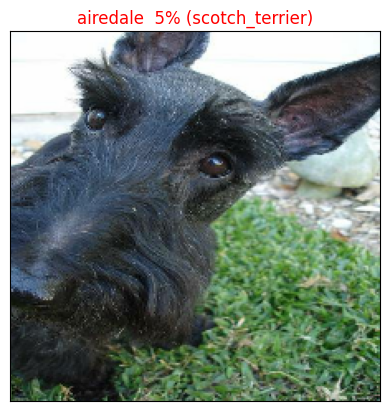

In [87]:

 plot_pred(prediction_probabilities=predictions,
           labels=val_labels,
           images=val_images,
           )

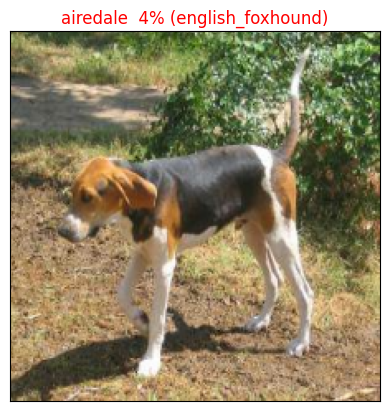

In [88]:
plot_pred(prediction_probabilities=predictions,
           labels=val_labels,
           images=val_images,
           n=42)

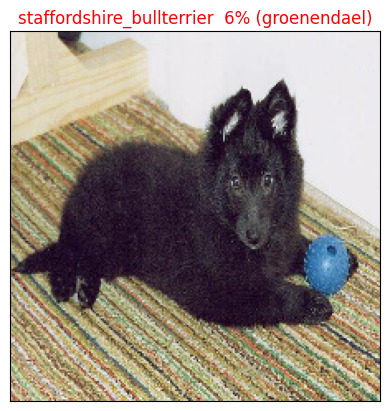

In [89]:
plot_pred(prediction_probabilities=predictions,
           labels=val_labels,
           images=val_images,
           n=77)



```
# This is formatted as code
```

what a cutie, looks like our dog Hugo (a german shephard) when he was a baby pup, a puppy i mean.

Now we have one function to visualize the models top prediction, let's make another to view our model's top 10 predictions.

This function will:
- Take an input of prediction probabilties array and a ground truth array and an integer
- Find the prediction using `get_pred_label()`
- Find the top 10:
    * prediction probabilities indexes
    * prediction probabilities values
    * prediction labels
- Plot the top 10 predictionprobability values and labels, coloring the true label green

In [90]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Get the prediction label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #Find the top predictions confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Frind the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

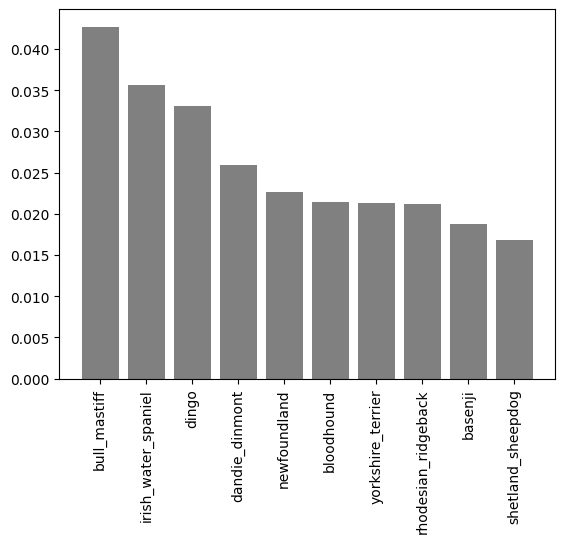

In [91]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Experiments!

In [92]:
predictions[0].argsort()[-10:][::-1]

array([ 15,  42,  73, 104,  60,  55, 101,  34, 119,   8])

In [93]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.03554391, 0.0317959 , 0.03153392, 0.02692495, 0.02584112,
       0.02459859, 0.02144233, 0.02069719, 0.02056471, 0.01808793],
      dtype=float32)

In [94]:
predictions[0].max()

0.035543915

In [95]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['bluetick', 'entlebucher', 'maltese_dog',
       'staffordshire_bullterrier', 'italian_greyhound', 'ibizan_hound',
       'siberian_husky', 'curly-coated_retriever', 'yorkshire_terrier',
       'basset'], dtype=object)

## More visualization - see more than one at once

Now we have the function to visulaize our predictions and evaluate our model, let us check out a few

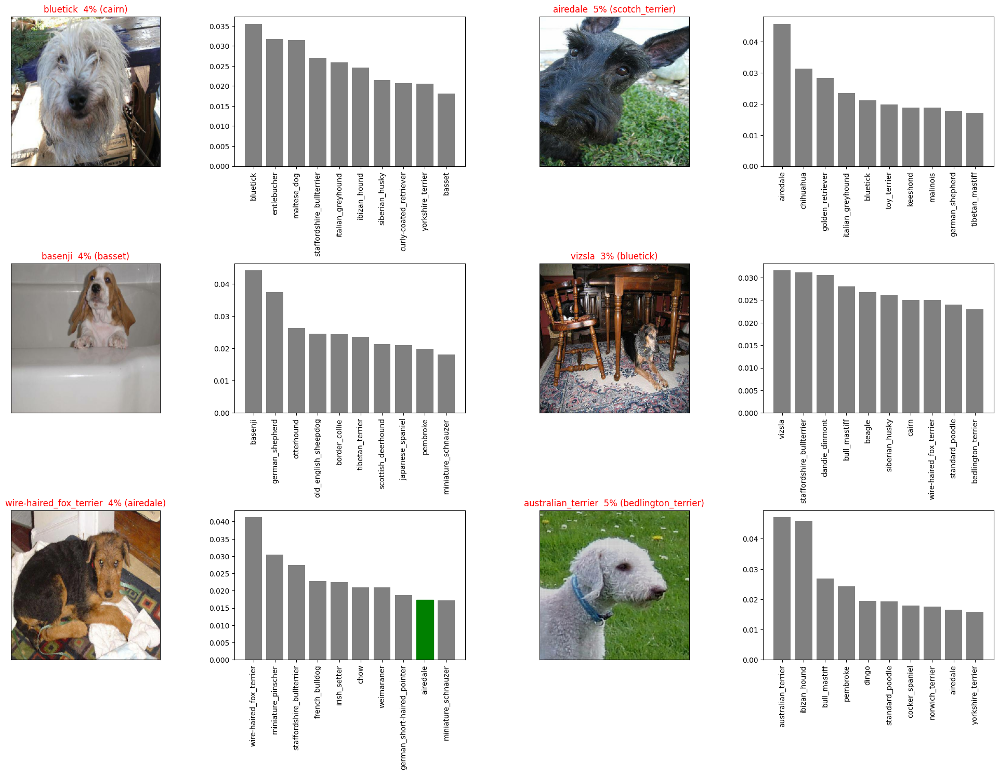

In [96]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


Task: We can make a confusion matrix for above predictions and true labels in model (multiclass classification metric)

## Saving and reloading a model

In [97]:
#Create a function to save a model
def save_model(model, suffix = None):
  '''
  Saves a given model in a models directory and appends a suffix(string)
  '''

  #Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/DogVision/save models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #save format to model
  print(f"Saving model to: {model_path}... ")
  model.save(model_path) #save() - a method to save model
  return model_path

In [98]:
# Creata a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path
  '''
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we have functions to save and load the trained model, let's check if it works!

In [99]:
#Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DogVision/save models/20230912-00321694478776-1000-images-mobilenetv2-Adam.h5... 


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/DogVision/save models/20230912-00321694478776-1000-images-mobilenetv2-Adam.h5'

In [100]:
#Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/DogVision/save models/20230910-15121694358746-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/DogVision/save models/20230910-15121694358746-1000-images-mobilenetv2-Adam.h5


In [101]:
#Evaluate the pre=saved model
model.evaluate(val_data)

7/7 [==============================] - 14s 2s/step - loss: 5.0997 - accuracy: 0.0000e+00


[5.099714279174805, 0.0]

In [102]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 14s 2s/step - loss: 1.0829 - accuracy: 0.6950


[1.0829176902770996, 0.6949999928474426]

#Training the model on the full dataset

In [103]:
len(X), len(y)

(10222, 10222)

In [104]:
#Create a data batch with the full data set
full_data = create_data_batches(X, y)


Creating training data set batches


In [105]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [106]:
#Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5


In [107]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cannot monitor validation accuracy without early stoppig callback
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience=3)

**Note: Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.**

In [108]:
#Fit the full model to the full data
#full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

## Saving and reloading the full model

In [109]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

Saving model to: drive/MyDrive/DogVision/save models/20230912-00331694478818-all-images-Adam.h5... 


'drive/MyDrive/DogVision/save models/20230912-00331694478818-all-images-Adam.h5'

In [110]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/DogVision/save models/20230910-15241694359455-all-images-Adam.h5')

Loading saved model from: drive/MyDrive/DogVision/save models/20230910-15241694359455-all-images-Adam.h5


## Making Predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

We created `create_data_batches()` earlier hwich can take a list of filenames as input ad cover them into Tensor batches.

To make predictions on the test data, we wil:
- get the test image filenames
- convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesnt have labels)
- make a predictions array by passing the test batches to the `predict()` method called on our model

In [111]:
#Load test image filenames
test_path = "drive/MyDrive/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/DogVision/test/e34654831e228ad3ac1d0c463e70caf6.jpg',
 'drive/MyDrive/DogVision/test/e218c0da622fedc975a97999ad7d48a5.jpg',
 'drive/MyDrive/DogVision/test/dce8d03553ab29570f67a28bf0ee0709.jpg',
 'drive/MyDrive/DogVision/test/e00e5f7f822fd670bba314f87cce8428.jpg',
 'drive/MyDrive/DogVision/test/e2faaf5e760a6189d0980e6355864b4c.jpg',
 'drive/MyDrive/DogVision/test/dd9d222a481e6cbea922a1b601a55a38.jpg',
 'drive/MyDrive/DogVision/test/e6cbd88414627be43910a1977ce28595.jpg',
 'drive/MyDrive/DogVision/test/e64b15ca154304104fe95ded7338858e.jpg',
 'drive/MyDrive/DogVision/test/e66eb9532985301394e1bfb8f05206d4.jpg',
 'drive/MyDrive/DogVision/test/e78d3997b4e7f4abc1299f81b8e3b2d9.jpg']

In [112]:
len(test_filenames)

10357

In [113]:
#Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches


In [114]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note: Since there are 10,000+ test images, making predictions could take a while, even on a GPU. So beware running the cell below may take up to an hour.**

In [115]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 829s 3s/step


In [116]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/DogVision/preds_array.csv", test_predictions, delimiter=",")

In [117]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/DogVision/preds_array.csv", delimiter=",")

In [118]:
test_predictions[:10] # Check out the test predictions

array([[5.03592057e-09, 1.33784123e-10, 2.34291360e-08, ...,
        2.88251358e-05, 9.92600846e-09, 4.59619454e-09],
       [5.81021347e-08, 1.99312164e-11, 2.17382067e-11, ...,
        2.37624671e-13, 4.01490702e-10, 1.24321068e-05],
       [2.04220796e-09, 1.13124357e-10, 3.71246610e-11, ...,
        1.37651002e-10, 4.05751521e-08, 9.17618592e-10],
       ...,
       [4.24343831e-08, 2.70696725e-12, 3.02531760e-08, ...,
        8.12702820e-06, 6.64238883e-07, 1.36288554e-06],
       [1.72503718e-08, 9.87560611e-09, 4.49816241e-07, ...,
        5.54879801e-03, 2.51121204e-08, 8.97944290e-07],
       [1.81045035e-09, 6.68166531e-13, 7.82769760e-08, ...,
        3.56849350e-09, 3.18970163e-11, 2.26946799e-08]])

In [119]:
test_predictions.shape

(10357, 120)

In [120]:
# Execute below code in case while running predictions model finds a corrupted file
# from struct import unpack
# from tqdm import tqdm
# import os


# marker_mapping = {
#     0xffd8: "Start of Image",
#     0xffe0: "Application Default Header",
#     0xffdb: "Quantization Table",
#     0xffc0: "Start of Frame",
#     0xffc4: "Define Huffman Table",
#     0xffda: "Start of Scan",
#     0xffd9: "End of Image"
# }


# class JPEG:
#     def __init__(self, image_file):
#         with open(image_file, 'rb') as f:
#             self.img_data = f.read()

#     def decode(self):
#         data = self.img_data
#         while(True):
#             marker, = unpack(">H", data[0:2])
#             # print(marker_mapping.get(marker))
#             if marker == 0xffd8:
#                 data = data[2:]
#             elif marker == 0xffd9:
#                 return
#             elif marker == 0xffda:
#                 data = data[-2:]
#             else:
#                 lenchunk, = unpack(">H", data[2:4])
#                 data = data[2+lenchunk:]
#             if len(data)==0:
#                 break


# bads = []

# for img in tqdm(test_filenames):
#   image = JPEG(img)
#   try:
#     image.decode()
#   except:
#     bads.append(img)

# print(bads)
# for name in bads:
#   print(name)
#   os.remove(osp.join(name))

# Final output in csv format
Models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed

To get the data in this format, we'll:

- Create a pandas DataFrame with an ID column as well as a column for each dog breed.
- Add data to the ID column by extracting the test image ID's from their filepaths.
- Add data (the prediction probabilites) to each of the dog breed columns.
- Export the DataFrame as a CSV to submit it to Kaggle.

In [121]:
# [id] + list(unique_breed)

In [122]:
#Create a Pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))

In [123]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [124]:
#Append test image IDs to prediction DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [125]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e34654831e228ad3ac1d0c463e70caf6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e218c0da622fedc975a97999ad7d48a5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dce8d03553ab29570f67a28bf0ee0709,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e00e5f7f822fd670bba314f87cce8428,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2faaf5e760a6189d0980e6355864b4c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [126]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e34654831e228ad3ac1d0c463e70caf6,5.035921e-09,1.337841e-10,2.342914e-08,1.394469e-09,8.614991e-01,4.539713e-08,2.897338e-07,5.073587e-06,8.017932e-09,...,6.026369e-07,7.863465e-09,7.326806e-08,5.024058e-07,5.908689e-10,6.928516e-10,4.972432e-08,2.882514e-05,9.926008e-09,4.596195e-09
1,e218c0da622fedc975a97999ad7d48a5,5.810213e-08,1.993122e-11,2.173821e-11,3.827114e-14,4.087602e-10,3.881433e-14,2.176929e-07,5.466791e-10,2.081686e-11,...,4.392094e-05,1.267518e-08,5.217802e-10,3.446714e-12,2.708985e-10,1.837546e-13,9.152791e-07,2.376247e-13,4.014907e-10,1.243211e-05
2,dce8d03553ab29570f67a28bf0ee0709,2.042208e-09,1.131244e-10,3.712466e-11,8.138110e-09,7.937565e-08,2.014132e-08,6.204287e-07,6.036609e-05,1.662154e-09,...,7.699924e-07,2.444894e-08,3.034517e-09,4.303270e-10,4.374045e-11,7.161953e-09,6.174060e-09,1.376510e-10,4.057515e-08,9.176186e-10
3,e00e5f7f822fd670bba314f87cce8428,2.358295e-11,3.766218e-10,1.142536e-09,5.341818e-07,5.440773e-09,9.220868e-07,5.198970e-11,8.239744e-10,2.263027e-08,...,9.155651e-10,1.450162e-08,5.083108e-08,7.807568e-08,1.075148e-07,2.779987e-10,5.695762e-09,1.046221e-08,1.546125e-09,1.255166e-09
4,e2faaf5e760a6189d0980e6355864b4c,1.154214e-06,2.548686e-05,1.110482e-05,8.008087e-06,1.365855e-06,3.516207e-07,5.779924e-10,6.766697e-08,6.246657e-06,...,7.153148e-09,1.310902e-06,7.930343e-09,4.863253e-05,5.760228e-05,1.080733e-07,7.084350e-03,5.212654e-05,4.042530e-04,5.942749e-05


In [127]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/DogVision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

# FINALLY ! - Making predictions on custom images

So I am now going to check if the models works well on my dog Hugo, cutest german shapehard in the entre world! I LOVE HUGGING HIM, HE IS GIANT!

I will throw in a couple of images of Piku( gold retriever, my cousin's dog)

Let us see what happens with the existing machine learning algorithms...

Steps:

* Get the filepaths of our my own images
* Turn the filepaths into data batches using `create_data_batches()`. And since our custome images wont have labels, we set the `test_data` paramaeter `True`
* Pass the custom image data batch to our model's `predict()` method
* Convert the prediction output probabilties to predictions labels
* Compare the predicted labels to the custom images

In [136]:
#Get the custom images filepaths
custom_path = "drive/MyDrive/DogVision/Doggies/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [137]:
custom_image_paths

['drive/MyDrive/DogVision/Doggies/de067a09-33b1-4734-a954-7c83096b686b.JPG',
 'drive/MyDrive/DogVision/Doggies/9dfaf336-2c68-4224-8954-dd323ab707d8.JPG',
 'drive/MyDrive/DogVision/Doggies/d7dfe7c1-22e0-417b-a2e9-9c126c0a8a95.JPG']

In [138]:
os.listdir(custom_path)

['de067a09-33b1-4734-a954-7c83096b686b.JPG',
 '9dfaf336-2c68-4224-8954-dd323ab707d8.JPG',
 'd7dfe7c1-22e0-417b-a2e9-9c126c0a8a95.JPG']

In [139]:
# Turn custom images into batch data sets
custom_data = create_data_batches(custom_image_paths, test_data = True)

Creating test data batches


In [140]:
custom_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [141]:
#Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 261ms/step


In [142]:
custom_preds.shape

(3, 120)

In [143]:
#Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range (len(custom_preds))]
custom_pred_labels

['golden_retriever', 'golden_retriever', 'kelpie']

In [144]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

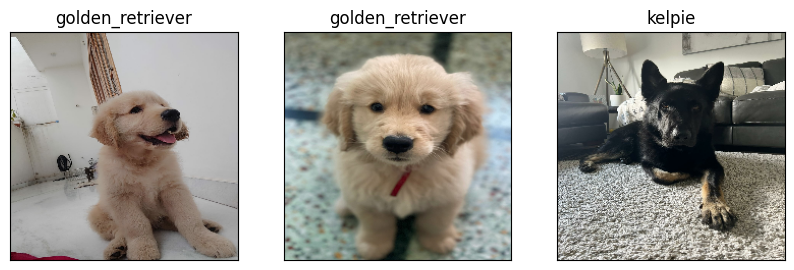

In [145]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

Aha! So the model predicted two out of the three images correctly, Piku is indeed a golden retriever but Hugo is a german shepherd.

The model predicts him as as a Kelpie. Just like humans can make error, machines can make them too.
But in this case it is interesting to note that the Australian Kelpie and German Sheparhds are quite alike.

Look at that smile below!!! awww I would hug him too probably.

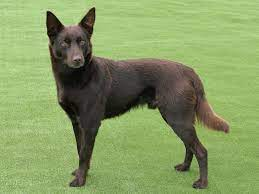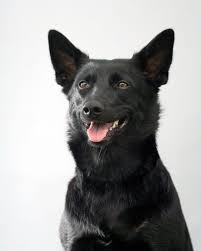

So from here on, the model can be further improved and enhanced by doing the following:

* Fine tuning
* Data augmentation
* Trying another odel form Tensorflow hub

That will be another exciting attempt.

**Le Fin!**